# Breast Cancer Detection

Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone. It starts when cells in the breast begin to grow out of control. These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

The key challenge against its detection is how to classify tumors into malignant (cancerous) or benign(non-cancerous).

**In this Project however, we will be carrying out the Exploratory Data Analysis for our Predictive Model**

In [116]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import PolynomialFeatures
from scipy.stats import binom

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


## Load Data

In [12]:
bc_df = pd.read_csv("/Users/mac/Downloads/breast-cancer.csv")
bc_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


## Data Cleaning

In [13]:
bc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [14]:
bc_df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### Binary Encoding 

Now, to be recognized by a machine learning algorithms, our categorical variables should be converted into numerical ones. One way to do this is through binary encoding. We will be changing our values "M" which stands for Malignant and "B" which stands for Benign to 1 and 0 respectively

In [23]:
bc_df.replace({"B": 0, "M": 1}, inplace=True)

In [25]:
bc_df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [18]:
bc_df.shape

(569, 32)

In [26]:
bc_df.groupby("diagnosis").mean()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
0,2.654382e+07,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
1,3.681805e+07,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530


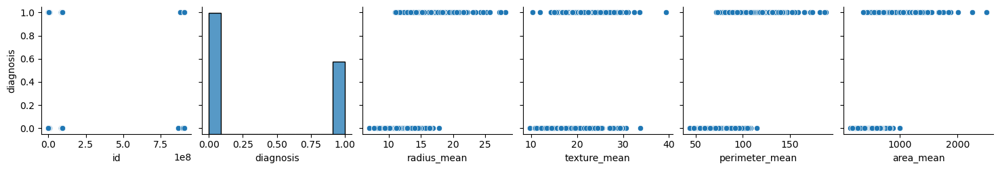

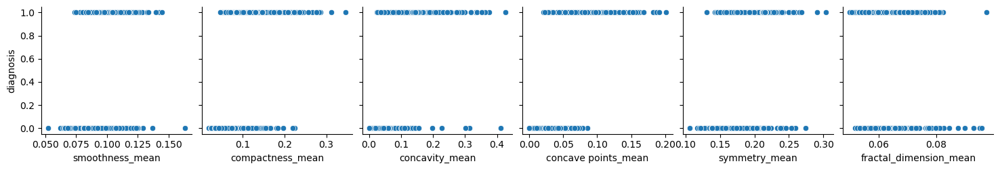

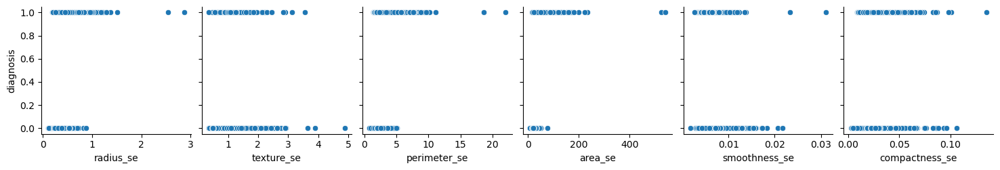

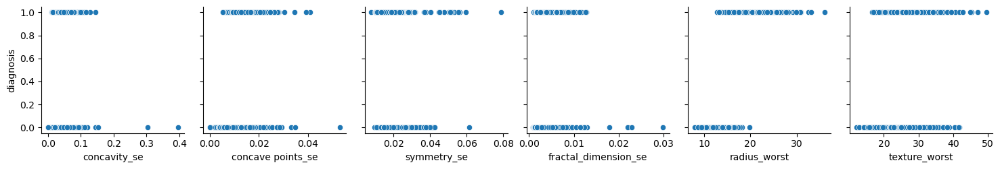

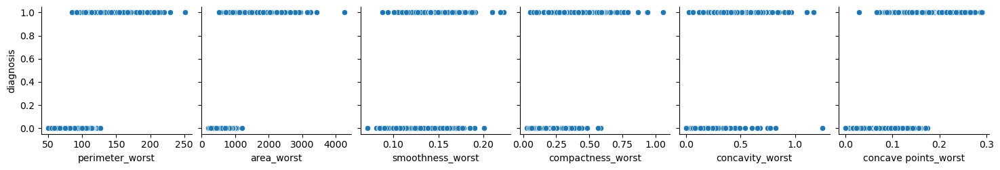

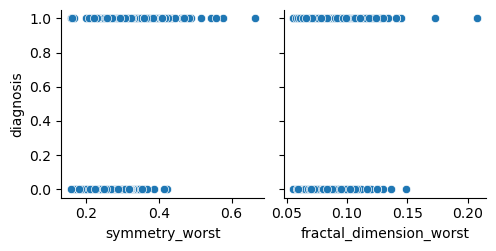

In [128]:
for i in range(0, len(bc_df.columns), 6):
    sns.pairplot(data=bc_df,
                x_vars=bc_df.columns[i:i+6],
                y_vars=['diagnosis'])

## Feature Selection


Here, we will select only those attributes which best explain the relationship of the independent variables with respect to the target variable, 'diagnosis'. There are many methods for feature selection, building the heatmap and calculating the correlation coefficients scores are the most commonly used ones.

From the heatmap above, light yellows means highly positively correlated features (relationship between two variables in which both variables move in the same direction), extreme purples means negatively correlated features (relationship between two variables in which an increase in one variable is associated with a decrease in the other).

In [51]:
bc_corr = bc_df.corr()['diagnosis'][:-1] # -1 means that the latest row is diagnosis
top_features = bc_corr[abs(bc_corr) > 0.5].sort_values(ascending=False)
top_features

diagnosis               1.000000
concave points_worst    0.793566
perimeter_worst         0.782914
concave points_mean     0.776614
radius_worst            0.776454
perimeter_mean          0.742636
area_worst              0.733825
radius_mean             0.730029
area_mean               0.708984
concavity_mean          0.696360
concavity_worst         0.659610
compactness_mean        0.596534
compactness_worst       0.590998
radius_se               0.567134
perimeter_se            0.556141
area_se                 0.548236
Name: diagnosis, dtype: float64

In [46]:
new_data = bc_df.loc[:, ["concave points_worst", "concave points_mean", "perimeter_worst", "perimeter_mean",
                        "radius_worst", "radius_mean", "area_worst","area_mean", "concavity_worst",
                         "concavity_mean",  "compactness_worst", "compactness_mean", "radius_se", 
                         "perimeter_se", "area_se", "diagnosis"]]

In [47]:
new_data

,concave points_worst,concave points_mean,perimeter_worst,perimeter_mean,radius_worst,radius_mean,area_worst,area_mean,concavity_worst,concavity_mean,compactness_worst,compactness_mean,radius_se,perimeter_se,area_se,diagnosis
0,0.2654,0.14710,184.60,122.80,25.380,17.99,2019.0,1001.0,0.7119,0.30010,0.66560,0.27760,1.0950,8.589,153.40,1
1,0.1860,0.07017,158.80,132.90,24.990,20.57,1956.0,1326.0,0.2416,0.08690,0.18660,0.07864,0.5435,3.398,74.08,1
2,0.2430,0.12790,152.50,130.00,23.570,19.69,1709.0,1203.0,0.4504,0.19740,0.42450,0.15990,0.7456,4.585,94.03,1
3,0.2575,0.10520,98.87,77.58,14.910,11.42,567.7,386.1,0.6869,0.24140,0.86630,0.28390,0.4956,3.445,27.23,1
4,0.1625,0.10430,152.20,135.10,22.540,20.29,1575.0,1297.0,0.4000,0.19800,0.20500,0.13280,0.7572,5.438,94.44,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0.2216,0.13890,166.10,142.00,25.450,21.56,2027.0,1479.0,0.4107,0.24390,0.21130,0.11590,1.1760,7.673,158.70,1
565,0.1628,0.09791,155.00,131.20,23.690,20.13,1731.0,1261.0,0.3215,0.14400,0.19220,0.10340,0.7655,5.203,99.04,1
566,0.1418,0.05302,126.70,108.30,18.980,16.60,1124.0,858.1,0.3403,0.09251,0.30940,0.10230,0.4564,3.425,48.55,1
567,0.2650,0.15200,184.60,140.10,25.740,20.60,1821.0,1265.0,0.9387,0.35140,0.86810,0.27700,0.7260,5.772,86.22,1


<Figure size 1500x1500 with 0 Axes>

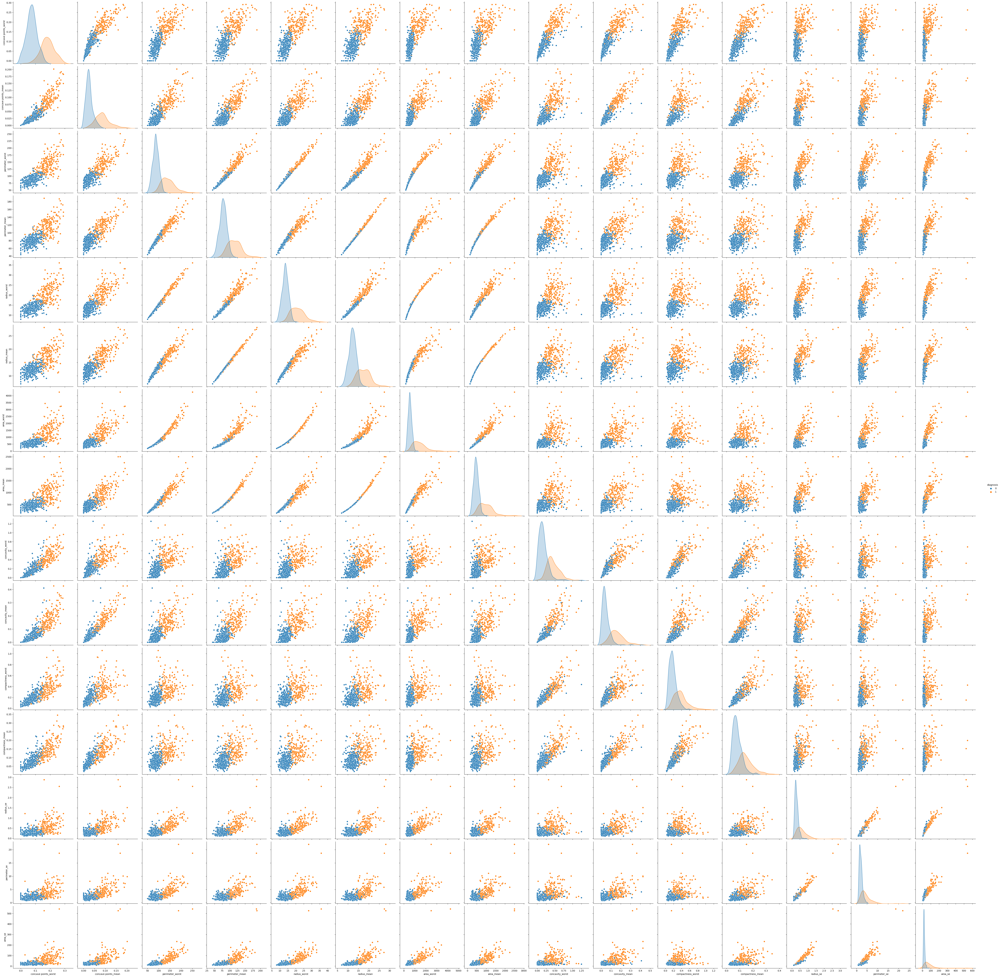

In [110]:
plt.figure(figsize=(15, 15))
sns.pairplot(new_data, hue='diagnosis', diag_kind='kde', height=4)
plt.show()

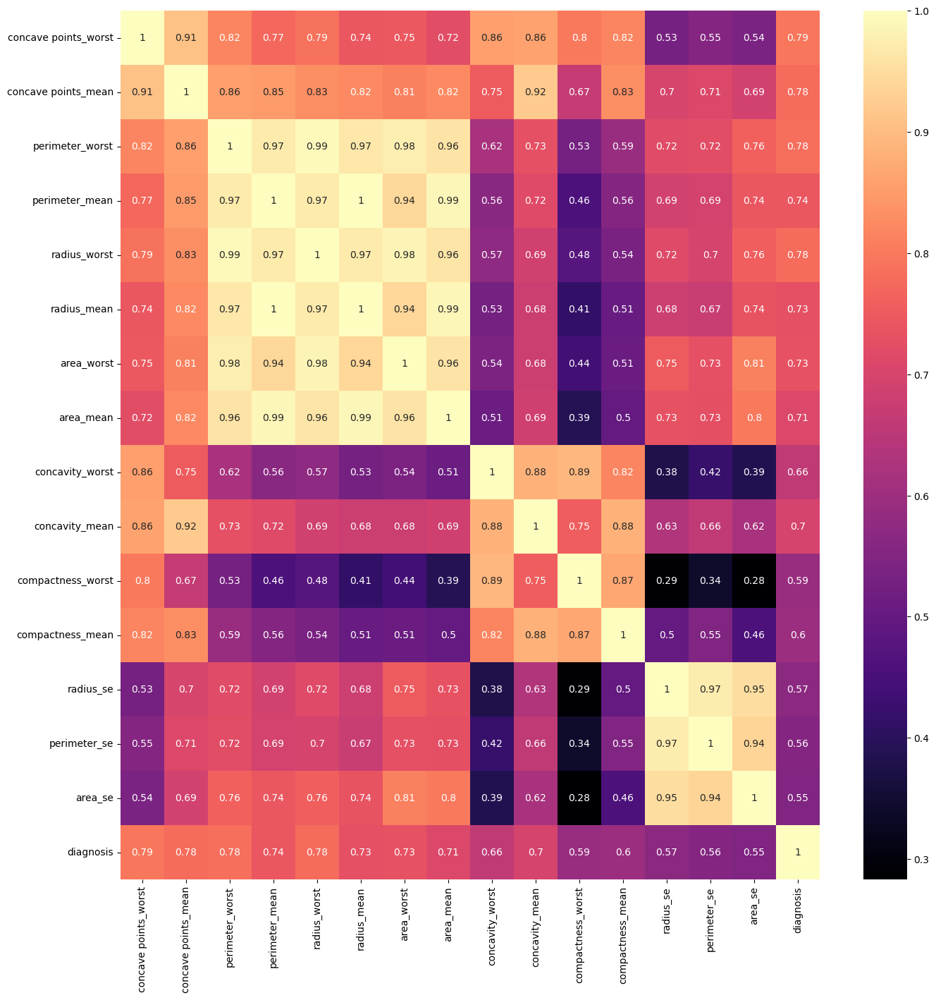

In [49]:
plt.figure(figsize=(16,16))
sns.heatmap(new_data.corr(), annot=True, cmap="magma");

In [54]:
features = new_data.corr()["diagnosis"].sort_values(ascending=False)
features

diagnosis               1.000000
concave points_worst    0.793566
perimeter_worst         0.782914
concave points_mean     0.776614
radius_worst            0.776454
perimeter_mean          0.742636
area_worst              0.733825
radius_mean             0.730029
area_mean               0.708984
concavity_mean          0.696360
concavity_worst         0.659610
compactness_mean        0.596534
compactness_worst       0.590998
radius_se               0.567134
perimeter_se            0.556141
area_se                 0.548236
Name: diagnosis, dtype: float64

We can also plot these correlation coefficients for easier visualization.

Text(0.5, 1.0, 'Correlation with Diagnosis')

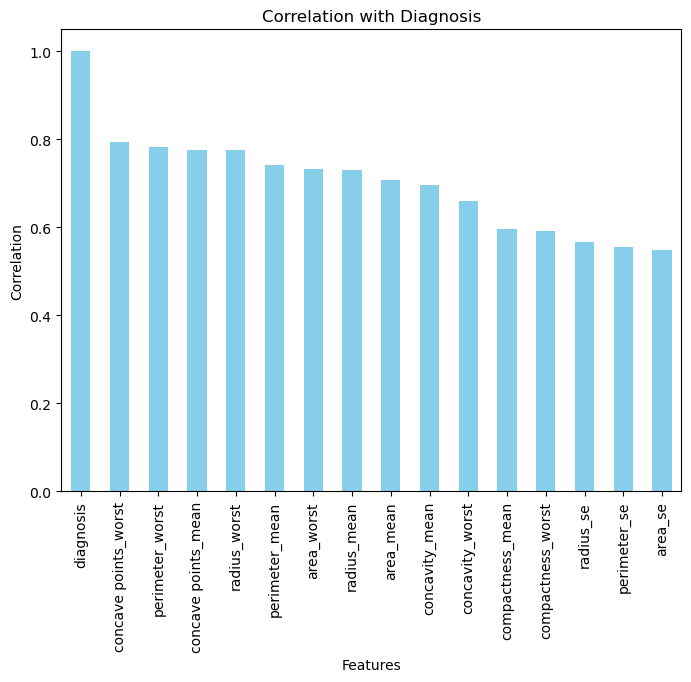

In [58]:
features.plot(kind="bar", figsize=(8,6), color="skyblue");

plt.xlabel('Features')
plt.ylabel('Correlation')
plt.title('Correlation with Diagnosis')

## Statistical Aggregation

In [131]:
features_to_analyze = ['radius_mean', 'texture_mean', 'area_mean']

# calculate mean, median, and standard deviation for each diagnosis category
statistics_by_diagnosis = bc_df.groupby('diagnosis')[features_to_analyze].agg(['mean', 'median', 'std'])

statistics_by_diagnosis


radius_mean                   texture_mean                   \
                 mean  median       std         mean median       std   
diagnosis                                                               
0           12.146524  12.200  1.780512    17.914762  17.39  3.995125   
1           17.462830  17.325  3.203971    21.604906  21.46  3.779470   

            area_mean                     
                 mean median         std  
diagnosis                                 
0          462.790196  458.4  134.287118  
1          978.376415  932.0  367.937978

## Feature Scaling

One of the most important transformations we need to apply to our data is feature scaling. There are two common ways to get all attributes to have the same scale: min-max scaling and standardization.

Min-max scaling (or normalization) is the simplest: values are shifted and rescaled so they end up ranging from 0 to 1. This is done by subtracting the min value and dividing by the max minus min.

Standardization is different: first it subtracts the mean value (so standardized values always have a zero mean), and then it divides by the standard deviation, so that the resulting distribution has unit variance.

First, we will normalize our data.

In [66]:
norm_data = MinMaxScaler().fit_transform(new_data)
norm_data

array([[0.91202749, 0.73111332, 0.66831017, ..., 0.3690336 , 0.27381126,
        1.        ],
       [0.63917526, 0.34875746, 0.53981772, ..., 0.12444047, 0.12565979,
        1.        ],
       [0.83505155, 0.63568588, 0.50844166, ..., 0.18037035, 0.16292179,
        1.        ],
       ...,
       [0.48728522, 0.26351889, 0.3799492 , ..., 0.12571267, 0.07797564,
        1.        ],
       [0.91065292, 0.7554672 , 0.66831017, ..., 0.23630024, 0.14833451,
        1.        ],
       [0.        , 0.        , 0.04357787, ..., 0.08438958, 0.02306322,
        0.        ]])

we can also standardize our data.

In [67]:
scaled_data = StandardScaler().fit_transform(new_data)
scaled_data

array([[ 2.29607613,  2.53247522,  2.30360062, ...,  2.83303087,
         2.48757756,  1.29767572],
       [ 1.0870843 ,  0.54814416,  1.53512599, ...,  0.26332697,
         0.74240195,  1.29767572],
       [ 1.95500035,  2.03723076,  1.34747521, ...,  0.8509283 ,
         1.18133606,  1.29767572],
       ...,
       [ 0.41406869,  0.10577736,  0.57900058, ...,  0.27669279,
         0.1806983 ,  1.29767572],
       [ 2.28998549,  2.65886573,  2.30360062, ...,  1.43852964,
         1.0095027 ,  1.29767572],
       [-1.74506282, -1.26181958, -1.43273495, ..., -0.15744905,
        -0.46615196, -0.77060855]])

## Handling outliers

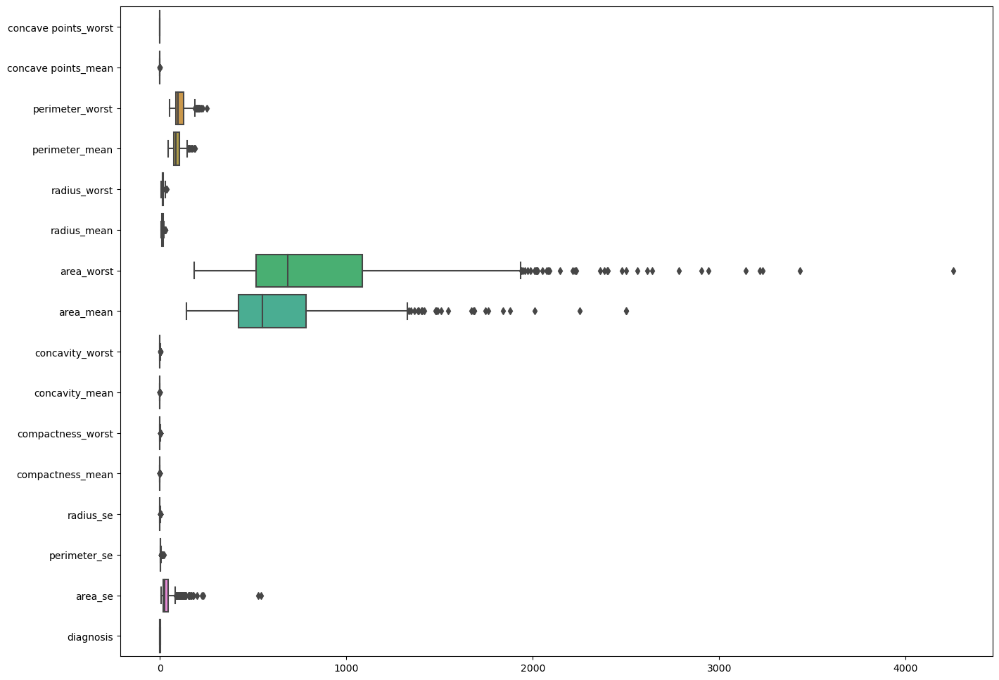

In [79]:
plt.figure(figsize=(16,12))

numerical_features = new_data.select_dtypes(include='number')

sns.boxplot(data=numerical_features, orient='h');

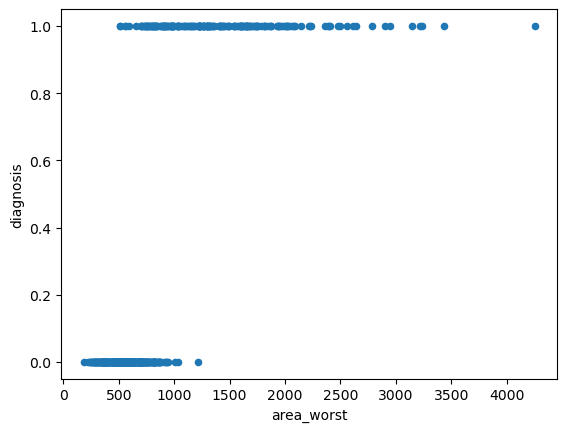

In [80]:
diag_area = new_data.plot.scatter(x='area_worst',
                      y='diagnosis')

### Deleting the Outliers

In [81]:
new_data.sort_values(by = 'area_worst', ascending = False)[:2]

,concave points_worst,concave points_mean,perimeter_worst,perimeter_mean,radius_worst,radius_mean,area_worst,area_mean,concavity_worst,concavity_mean,compactness_worst,compactness_mean,radius_se,perimeter_se,area_se,diagnosis
461,0.2625,0.16890,251.2,186.9,36.04,27.42,4254.0,2501.0,0.6833,0.3635,0.4256,0.1988,2.547,18.650,542.2,1
265,0.1659,0.08646,214.0,135.7,32.49,20.73,3432.0,1419.0,0.3442,0.1367,0.2644,0.1143,1.172,7.749,199.7,1


In [83]:
outliers_dropped = new_data.drop(new_data.index[[461,265]])

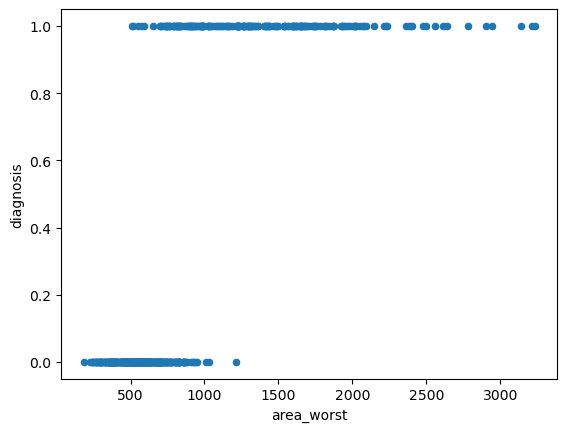

In [84]:
new_plot = outliers_dropped.plot.scatter(x='area_worst',
                      y='diagnosis')

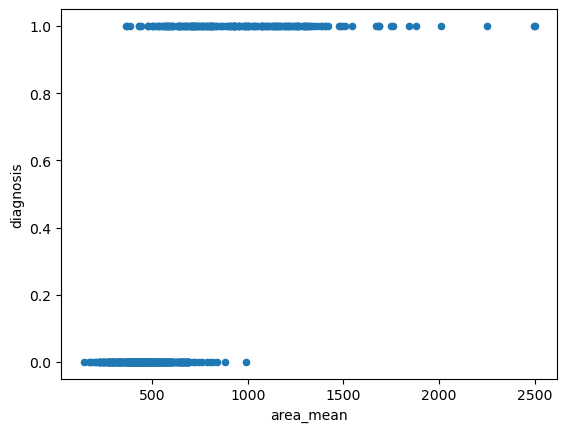

In [85]:
diag_area = new_data.plot.scatter(x='area_mean',
                      y='diagnosis')

### Deleting the Outliers

In [91]:
new_data.sort_values(by = 'area_mean', ascending = False)[:3]

,concave points_worst,concave points_mean,perimeter_worst,perimeter_mean,radius_worst,radius_mean,area_worst,area_mean,concavity_worst,concavity_mean,compactness_worst,compactness_mean,radius_se,perimeter_se,area_se,diagnosis
461,0.2625,0.1689,251.2,186.9,36.04,27.42,4254.0,2501.0,0.6833,0.3635,0.4256,0.1988,2.5470,18.65,542.2,1
212,0.1595,0.1595,188.5,188.5,28.11,28.11,2499.0,2499.0,0.3201,0.3201,0.1516,0.1516,2.8730,21.98,525.6,1
180,0.2688,0.1878,220.8,182.1,33.12,27.22,3216.0,2250.0,0.5340,0.2871,0.4034,0.1914,0.8361,5.82,128.7,1


In [92]:
outliers_dropped = new_data.drop(new_data.index[[461,212, 180]])

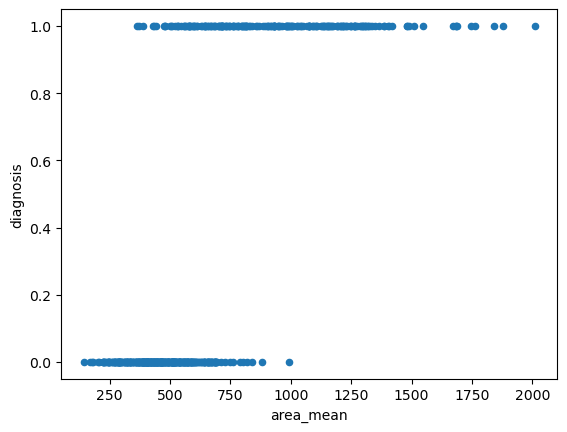

In [93]:
new_plot = outliers_dropped.plot.scatter(x='area_mean',
                      y='diagnosis')

## Feature Extraction using Principal Component Analysis

In [112]:
feats = new_data.drop("diagnosis", axis=1)

In [113]:
X = feats
y = new_data["diagnosis"]

,concave points_worst,concave points_mean,perimeter_worst,perimeter_mean,radius_worst,radius_mean,area_worst,area_mean,concavity_worst,concavity_mean,compactness_worst,compactness_mean,radius_se,perimeter_se,area_se
0,0.2654,0.14710,184.60,122.80,25.380,17.99,2019.0,1001.0,0.7119,0.30010,0.66560,0.27760,1.0950,8.589,153.40
1,0.1860,0.07017,158.80,132.90,24.990,20.57,1956.0,1326.0,0.2416,0.08690,0.18660,0.07864,0.5435,3.398,74.08
2,0.2430,0.12790,152.50,130.00,23.570,19.69,1709.0,1203.0,0.4504,0.19740,0.42450,0.15990,0.7456,4.585,94.03
3,0.2575,0.10520,98.87,77.58,14.910,11.42,567.7,386.1,0.6869,0.24140,0.86630,0.28390,0.4956,3.445,27.23
4,0.1625,0.10430,152.20,135.10,22.540,20.29,1575.0,1297.0,0.4000,0.19800,0.20500,0.13280,0.7572,5.438,94.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0.2216,0.13890,166.10,142.00,25.450,21.56,2027.0,1479.0,0.4107,0.24390,0.21130,0.11590,1.1760,7.673,158.70
565,0.1628,0.09791,155.00,131.20,23.690,20.13,1731.0,1261.0,0.3215,0.14400,0.19220,0.10340,0.7655,5.203,99.04
566,0.1418,0.05302,126.70,108.30,18.980,16.60,1124.0,858.1,0.3403,0.09251,0.30940,0.10230,0.4564,3.425,48.55
567,0.2650,0.15200,184.60,140.10,25.740,20.60,1821.0,1265.0,0.9387,0.35140,0.86810,0.27700,0.7260,5.772,86.22


In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [118]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [119]:
pca = PCA(n_components=7)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [121]:
model = LogisticRegression()
model.fit(X_train_pca, y_train)

LogisticRegression()

In [122]:
y_pred = model.predict(X_test_pca)

In [123]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy with PCA components: {accuracy:.4f}")

Accuracy with PCA components: 0.9737


In [124]:
explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained Variance Ratio: {explained_variance_ratio}")

Explained Variance Ratio: [0.73170821 0.14784495 0.07131572 0.01556113 0.01235691 0.00803626
 0.00440942]


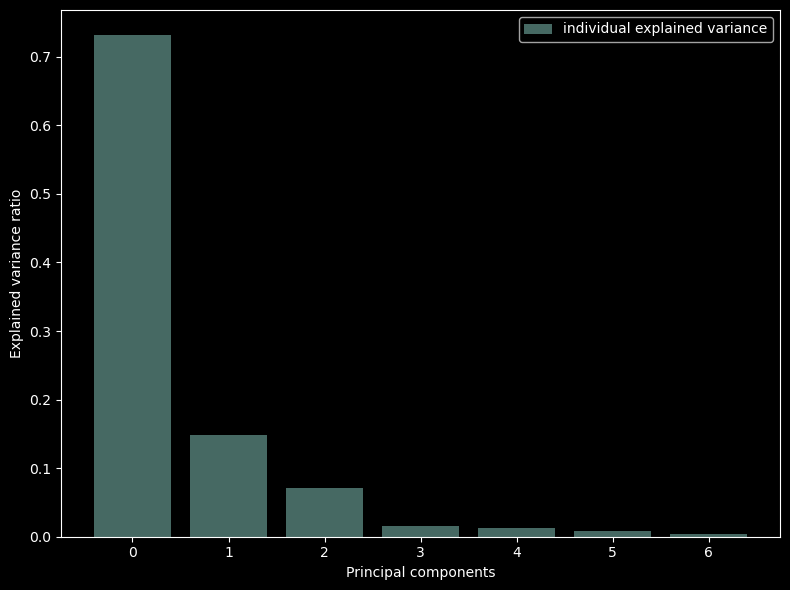

In [125]:
with plt.style.context('dark_background'):
    plt.figure(figsize=(8,6))
    
    plt.bar(range(7), explained_variance_ratio, alpha=0.5, align='center',
           label='individual explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

## Summary

This was interesting to explore, EDA journey establishes the groundwork for a robust breast cancer detection model. Ongoing tweaks and enhancements can be made based on fresh insights and meticulous evaluation metrics.